In [1]:
#!pip install ultralytics -qq
# from ultralytics import YOLOWorld
from PIL import Image
import matplotlib.pyplot as plt
import os
import pandas as pd

In [2]:
from ultralytics import YOLOWorld
model = YOLOWorld('yolov8x-worldv2.pt')

In [3]:
train_df = pd.read_csv('./G340890_50m_panoid(2).csv')

In [4]:
train_df

,panoid,lat,lon,var1,heading,var3,var4,year,month
0,004g0nBjiAoWzLLLCT252A,40.862831,-73.907227,33.506706,271.509120,88.789510,1.265002,2022,11
1,004WOqNXaDG1GWxw1aq0kA,40.880501,-73.900636,7.838017,24.733295,90.740005,0.193049,2019,8
2,005FEssqWDoX8qyMsk-7ig,40.854582,-73.854778,30.942800,149.051450,88.802890,1.954567,2015,10
3,005Gu_dGcXTN_PuTJgNAuw,40.899717,-73.843935,36.128685,71.163790,94.162575,359.729920,2018,9
4,005NcqQBhcNxQxN57-zbjQ,40.778504,-73.925649,47.360750,329.386470,91.243830,359.905270,2011,9
...,...,...,...,...,...,...,...,...,...
341848,ZzZOHUzJ5GU8QpQXNpMElA,40.814607,-73.926367,3.481557,299.488500,89.482290,0.835001,2022,10
341849,ZZzsNFVbkbO66_wiCP4dcg,40.817899,-73.916987,12.972485,200.212940,91.807170,1.023868,2017,10
341850,zZzsPdZ9PjRdLSjGvnxYNA,40.850479,-73.883429,25.637087,110.750470,89.122990,357.758760,2017,10
341851,zZZT2DAeoaAGtijlNHq2nQ,40.831027,-73.832043,5.560051,230.695860,90.181076,358.741300,2021,9


In [5]:
import os
import pandas as pd
from collections import defaultdict

# Define the base folder and orientations
base_folder = "/hpi/fs00/scratch/alexandra.kudaeva/street-view-data/output/G340890_50m"
orientations = ["front", "back", "left", "right"]

def check_missing_images(base_folder, train_df, orientations):
    missing_counts = defaultdict(int)  # Dictionary to store missing counts for each orientation
    missing_details = []  # List to store details of missing files for debugging

    for panoid in train_df["panoid"]:
        # Create subfolder path based on `0/0/4` structure
        subfolder = os.path.join(base_folder, panoid[0], panoid[1], panoid[2])
        for orientation in orientations:
            filename = f"{panoid}_{orientation}.webp"  # Construct the filename
            filepath = os.path.join(subfolder, filename)
            if not os.path.exists(filepath):
                missing_counts[orientation] += 1
                missing_details.append({"panoid": panoid, "orientation": orientation})
    
    return missing_counts, missing_details

# Execute the function
#missing_counts, missing_details = check_missing_images(base_folder, train_df, orientations)

# Print results
print("Accumulated Missing Counts by Orientation:")
#for orientation, count in missing_counts.items():
#    print(f"{orientation}: {count}")

print("\nDetails of Missing Files:")
#for detail in missing_details:
#    print(detail)

Accumulated Missing Counts by Orientation:

Details of Missing Files:


In [6]:
import osmnx as ox

# Define the bounding box or location
place_name = "New York City, USA"
tags = {'amenity': ['post_box', 'bench', 'bus_station', 'waste_basket', 'charging_station', 'fuel', 'atm', 'telephone', 'waste_disposal', 'recycling', 'vending_machine']}  # Fetch all amenities


gdf = ox.features_from_place(place_name, tags)

# Extract latitude and longitude from the geometries
gdf['latitude'] = gdf.geometry.centroid.y
gdf['longitude'] = gdf.geometry.centroid.x

amenities_lat_lon_df = gdf[['amenity', 'latitude', 'longitude']]
print(amenities_lat_lon_df)

                           amenity   latitude  longitude
element id                                              
node    42538083             bench  40.673352 -73.970702
        357618584         post_box  40.682496 -73.962688
        357618608         post_box  40.643833 -73.979460
        368043710            bench  40.748034 -73.982649
        368047025         post_box  40.680693 -74.006422
...                            ...        ...        ...
way     1319909118           bench  40.720378 -74.010841
        1319909119           bench  40.720343 -74.010985
        1319909120           bench  40.720334 -74.010894
        1319909121           bench  40.720327 -74.010823
        1337088238  waste_disposal  40.734584 -73.738718

[25783 rows x 3 columns]


/tmp/ipykernel_3962390/2533083236.py:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['latitude'] = gdf.geometry.centroid.y
/tmp/ipykernel_3962390/2533083236.py:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['longitude'] = gdf.geometry.centroid.x


In [7]:
import osmnx as ox

# Define the location
place_name = "New York City, USA"

# Define tags to query traffic signals and stop signs
tags = {
    'highway': ['traffic_signals', 'stop']  # Fetch both traffic signals and stop signs
}

# Fetch the features using OSMnx
gdf = ox.features_from_place(place_name, tags)

# Ensure geometries are points to extract centroids
if 'geometry' in gdf.columns and gdf.geometry.notnull().any():
    gdf['latitude'] = gdf.geometry.centroid.y
    gdf['longitude'] = gdf.geometry.centroid.x
else:
    gdf['latitude'] = None
    gdf['longitude'] = None

# Filter data for traffic signals and stop signs
if 'highway' in gdf.columns:
    traffic_signals_df = gdf[gdf['highway'] == 'traffic_signals'].copy()
    stop_signs_df = gdf[gdf['highway'] == 'stop'].copy()
else:
    traffic_signals_df = gdf.iloc[0:0].copy()  # Empty DataFrame if no highway column
    stop_signs_df = gdf.iloc[0:0].copy()

# Add counts for each type
traffic_signals_count = traffic_signals_df.shape[0]
stop_signs_count = stop_signs_df.shape[0]

# Combine both into a single DataFrame for analysis
combined_df = pd.concat([traffic_signals_df, stop_signs_df])

# Display results
print(f"Total traffic signals: {traffic_signals_count}")
print(f"Total stop signs: {stop_signs_count}")
print(f"Total detected: {traffic_signals_count + stop_signs_count}")

# Optional: Save to a file for analysis
#combined_df.to_csv("traffic_signals_and_stop_signs.csv", index=False)



Total traffic signals: 17941
Total stop signs: 27213
Total detected: 45154


/tmp/ipykernel_3962390/4026884689.py:16: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['latitude'] = gdf.geometry.centroid.y
/tmp/ipykernel_3962390/4026884689.py:17: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['longitude'] = gdf.geometry.centroid.x


In [8]:
combined_df
combined_df = combined_df[['highway','latitude','longitude']]
combined_df = combined_df.reset_index(drop=True)
combined_df

,highway,latitude,longitude
0,traffic_signals,40.798048,-73.960044
1,traffic_signals,40.798654,-73.961474
2,traffic_signals,40.799244,-73.962873
3,traffic_signals,40.800429,-73.965691
4,traffic_signals,40.801398,-73.967996
...,...,...,...
45149,stop,40.629499,-74.012209
45150,stop,40.671738,-73.843366
45151,stop,40.671754,-73.846647
45152,stop,40.837484,-73.861178


In [9]:
import pandas as pd

# List of amenities to count
amenities_of_interest = [
    'traffic_signals',
    'stop'
]

for amenity_name in amenities_of_interest:
    count = (combined_df['highway'] == amenity_name).sum()
    print(f"{amenity_name}: {count}")


traffic_signals: 17941
stop: 27213


In [10]:
#!pip install geopy
import pandas as pd
from geopy.distance import geodesic
import math

result_list = []

# Define approximate degree deltas for ~30 meters:
# Latitude: ~111 km per degree, so 30 m ~ 0.00027 degrees
lat_delta = 0.0003  # A slightly larger buffer than 0.00027 for safety

# We'll dynamically compute longitude delta to be safe:
# longitude degrees change with latitude, so we compute for each point.
def get_lon_delta(lat):
    return 0.0003 / math.cos(math.radians(lat))

for index, row in train_df.iterrows():
    pic_lat = row['lat']
    pic_lon = row['lon']

    # Compute bounding box around the picture
    lon_delta = get_lon_delta(pic_lat)
    lat_min = pic_lat - lat_delta
    lat_max = pic_lat + lat_delta
    lon_min = pic_lon - lon_delta
    lon_max = pic_lon + lon_delta

    # Filter amenities by bounding box
    subset = combined_df[
        (combined_df['latitude'] >= lat_min) &
        (combined_df['latitude'] <= lat_max) &
        (combined_df['longitude'] >= lon_min) &
        (combined_df['longitude'] <= lon_max)
    ]
    
    # Now compute geodesic distance on this filtered subset
    pic_coords = (pic_lat, pic_lon)
    amenities_in_radius = []
    for _, amenity_row in subset.iterrows():
        amenity_coords = (amenity_row['latitude'], amenity_row['longitude'])
        dist = geodesic(pic_coords, amenity_coords).meters
        if dist <= 30:
            amenities_in_radius.append({
                'amenity': amenity_row['highway'],
                'latitude': amenity_row['latitude'],
                'longitude': amenity_row['longitude']
            })
    if amenities_in_radius:
        result_list.append({
            'id': row['panoid'],
            'latitude': pic_lat,
            'longitude': pic_lon,
            'amenities': amenities_in_radius
        })

final_df = pd.DataFrame(result_list)
print(final_df)


                            id   latitude  longitude  \
0       004WOqNXaDG1GWxw1aq0kA  40.880501 -73.900636   
1       00AH1hMHVhIKYF7Dn52gvQ  40.844090 -73.922783   
2       00BG2n9PnEFethnMWWu3Zg  40.832972 -73.861525   
3       00Dg2wxRvswsNV3cPJ3Fyg  40.839885 -73.909212   
4       00dWray38mckOF8zp5GdrQ  40.851627 -73.895493   
...                        ...        ...        ...   
110743  ZzYaVW5Mz7Oq9XawiNVfdA  40.836787 -73.846707   
110744  zZyb_WU9PmCFSR313bQ3iA  40.830166 -73.923394   
110745  zzYLFS-WDh2LkkI6l2lU0A  40.842725 -73.922890   
110746  zzzAhYqy823mA1dvpfHEuQ  40.862015 -73.912924   
110747  Zzzd7SlkckA2OBiXjWoODw  40.904114 -73.904754   

                                                amenities  
0       [{'amenity': 'traffic_signals', 'latitude': 40...  
1       [{'amenity': 'traffic_signals', 'latitude': 40...  
2       [{'amenity': 'traffic_signals', 'latitude': 40...  
3       [{'amenity': 'stop', 'latitude': 40.8398157, '...  
4       [{'amenity': 'traff

In [11]:
from geopy.distance import geodesic
import pandas as pd

distance_results = []


for _, row in final_df.iterrows():
    # Get the ID point coordinates
    id_coords = (row['latitude'], row['longitude'])
    
    amenities_with_distances = []
    
    # iterate over the amenities for this id
    for amenity in row['amenities']:
        amenity_coords = (amenity['latitude'], amenity['longitude'])
        distance = geodesic(id_coords, amenity_coords).meters 
        
        amenities_with_distances.append({
            'amenity': amenity['amenity'],
            'latitude': amenity['latitude'],
            'longitude': amenity['longitude'],
            'distance_from_id': distance
        })
    
    distance_results.append({
        'latitude': row['latitude'],
        'longitude': row['longitude'],
        'id': row['id'],
        'amenities': amenities_with_distances
    })

final_with_distances_df = pd.DataFrame(distance_results)
print(final_with_distances_df)


         latitude  longitude                      id  \
0       40.880501 -73.900636  004WOqNXaDG1GWxw1aq0kA   
1       40.844090 -73.922783  00AH1hMHVhIKYF7Dn52gvQ   
2       40.832972 -73.861525  00BG2n9PnEFethnMWWu3Zg   
3       40.839885 -73.909212  00Dg2wxRvswsNV3cPJ3Fyg   
4       40.851627 -73.895493  00dWray38mckOF8zp5GdrQ   
...           ...        ...                     ...   
110743  40.836787 -73.846707  ZzYaVW5Mz7Oq9XawiNVfdA   
110744  40.830166 -73.923394  zZyb_WU9PmCFSR313bQ3iA   
110745  40.842725 -73.922890  zzYLFS-WDh2LkkI6l2lU0A   
110746  40.862015 -73.912924  zzzAhYqy823mA1dvpfHEuQ   
110747  40.904114 -73.904754  Zzzd7SlkckA2OBiXjWoODw   

                                                amenities  
0       [{'amenity': 'traffic_signals', 'latitude': 40...  
1       [{'amenity': 'traffic_signals', 'latitude': 40...  
2       [{'amenity': 'traffic_signals', 'latitude': 40...  
3       [{'amenity': 'stop', 'latitude': 40.8398157, '...  
4       [{'amenity': 'traff

In [12]:
final_with_distances_df["amenities"][0]

[{'amenity': 'traffic_signals',
  'latitude': 40.8805067,
  'longitude': -73.900648,
  'distance_from_id': 1.23040216078539},
 {'amenity': 'stop',
  'latitude': 40.880285,
  'longitude': -73.9006436,
  'distance_from_id': 23.94753967585711}]

In [13]:
amenities_map = {
    "stop": "stop sign",
    "traffic_signals" : "traffic_signals"
    # "bench": "bench",
    # "bus_station": "bus station",
    # "waste_basket": "trash bin",
    # "charging_station": "electric charging station",
    # "atm": "atm",
    # "telephone": "payphone",
    # "waste_disposal": "large waste dumpster",
    # "recycling": "recycling bin",
    # "vending_machine": "vending machine"
}

In [14]:
#!pip install numpy
import os
import pandas as pd


reverse_amenities_map = {v: k for k, v in amenities_map.items()}

base_folder = "/hpi/fs00/scratch/alexandra.kudaeva/street-view-data/output/G340890_50m"
orientations = ["front", "back", "left", "right"]

detection_results = []

for idx, row in final_with_distances_df.iterrows():
    image_id = row['id']

    # Gather raw amenities for this row
    raw_amenities = list(set(a['amenity'] for a in row['amenities']))

    # Convert raw amenities to descriptive names
    descriptive_amenities = [
        amenities_map[a] if a in amenities_map else a
        for a in raw_amenities
    ]
    
    # Instruct the model to detect these descriptive amenities
    model.set_classes(descriptive_amenities)

    # Build subfolder path from the first three characters of image_id
    s1, s2, s3 = image_id[0], image_id[1], image_id[2]
    folder_path = os.path.join(base_folder, s1, s2, s3)

    for orientation in orientations:
        image_filename = f"{image_id}_{orientation}.webp"
        image_path = os.path.join(folder_path, image_filename)

        if not os.path.exists(image_path):
            continue

        # Run inference (verbose=False to suppress console output)
        results = model.predict(source=image_path, verbose=False)

        for result in results:
            # each box: [x_min, y_min, x_max, y_max, confidence, class_id]
            for box in result.boxes.data.tolist():
                cls_id = int(box[5])
                # This label will be the *descriptive* name you set above
                descriptive_label = model.names[cls_id]
                confidence = box[4]
                
                # If you want to ensure it's one of the chosen descriptive amenities:
                if descriptive_label in descriptive_amenities:
                    # Optionally map back to original amenity key if needed
                    original_label = reverse_amenities_map.get(descriptive_label, descriptive_label)
                    
                    # Or just use the descriptive_label if that’s what you want to store
                    detection_results.append({
                        'id': image_id,
                        'subfolder': f"{s1}/{s2}/{s3}",
                        'orientation': orientation,
                        'label': original_label,
                        'confidence': confidence,
                        'x_min': box[0],
                        'y_min': box[1],
                        'x_max': box[2],
                        'y_max': box[3]
                    })

detection_df = pd.DataFrame(detection_results)
print(detection_df)

                            id subfolder orientation            label  \
0       004WOqNXaDG1GWxw1aq0kA     0/0/4       front  traffic_signals   
1       004WOqNXaDG1GWxw1aq0kA     0/0/4       front  traffic_signals   
2       004WOqNXaDG1GWxw1aq0kA     0/0/4       front  traffic_signals   
3       004WOqNXaDG1GWxw1aq0kA     0/0/4       front  traffic_signals   
4       004WOqNXaDG1GWxw1aq0kA     0/0/4        left  traffic_signals   
...                        ...       ...         ...              ...   
703540  Zzzd7SlkckA2OBiXjWoODw     Z/z/z       front  traffic_signals   
703541  Zzzd7SlkckA2OBiXjWoODw     Z/z/z       front  traffic_signals   
703542  Zzzd7SlkckA2OBiXjWoODw     Z/z/z       front  traffic_signals   
703543  Zzzd7SlkckA2OBiXjWoODw     Z/z/z       front  traffic_signals   
703544  Zzzd7SlkckA2OBiXjWoODw     Z/z/z        back  traffic_signals   

        confidence       x_min       y_min       x_max       y_max  
0         0.433491  664.357666  336.285156  708.307190

In [15]:
filtered_df = detection_df[detection_df["confidence"] > 0.5]

In [16]:
filtered_df

,id,subfolder,orientation,label,confidence,x_min,y_min,x_max,y_max
4,004WOqNXaDG1GWxw1aq0kA,0/0/4,left,traffic_signals,0.897683,205.162186,247.888855,223.959900,283.349640
5,004WOqNXaDG1GWxw1aq0kA,0/0/4,left,traffic_signals,0.876782,233.371887,247.775726,247.834106,284.439117
6,004WOqNXaDG1GWxw1aq0kA,0/0/4,left,traffic_signals,0.694923,154.835068,383.534058,169.067825,399.070465
12,004WOqNXaDG1GWxw1aq0kA,0/0/4,right,traffic_signals,0.570642,363.986572,360.215424,376.622925,372.778931
13,00AH1hMHVhIKYF7Dn52gvQ,0/0/A,front,traffic_signals,0.896251,502.560913,287.788269,511.609985,308.338562
...,...,...,...,...,...,...,...,...,...
703537,Zzzd7SlkckA2OBiXjWoODw,Z/z/z,front,traffic_signals,0.715873,28.096678,360.647980,48.822456,379.284760
703538,Zzzd7SlkckA2OBiXjWoODw,Z/z/z,front,traffic_signals,0.689325,466.003143,306.658813,475.714478,326.884735
703539,Zzzd7SlkckA2OBiXjWoODw,Z/z/z,front,traffic_signals,0.644809,50.449852,361.816498,70.417671,380.752380
703540,Zzzd7SlkckA2OBiXjWoODw,Z/z/z,front,traffic_signals,0.566792,466.190491,306.007355,479.778595,326.864960


/tmp/ipykernel_3962390/965364352.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['image_path'] = filtered_df.apply(get_image_path, axis=1)


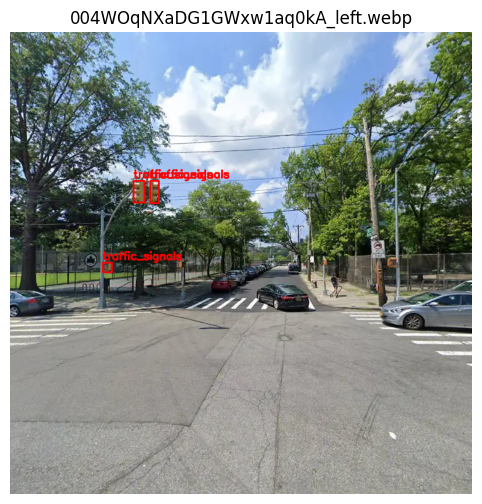

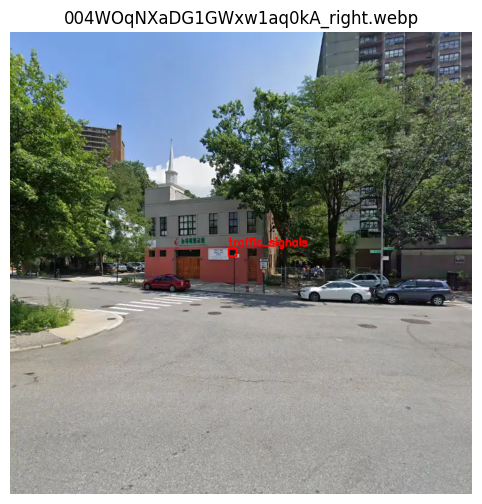

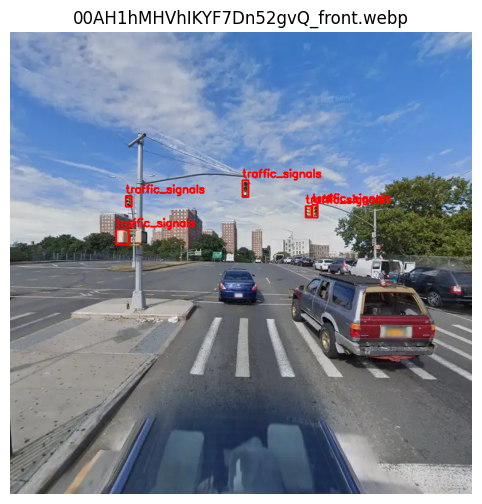

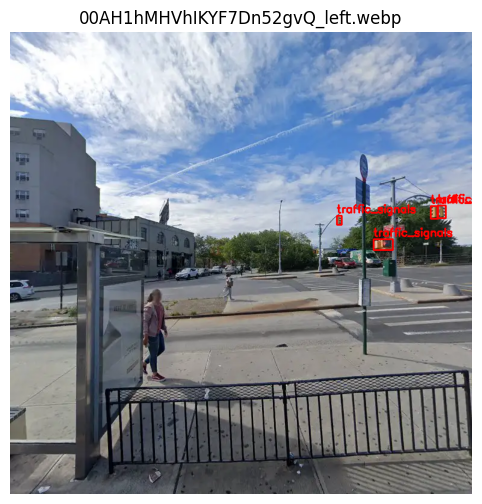

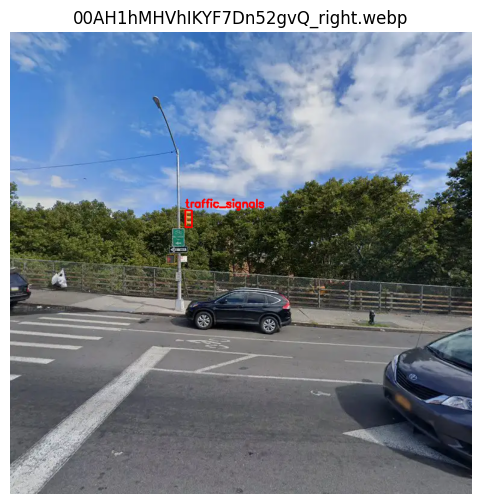

...

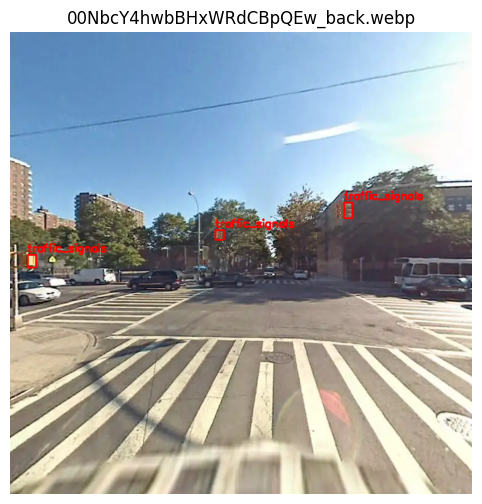

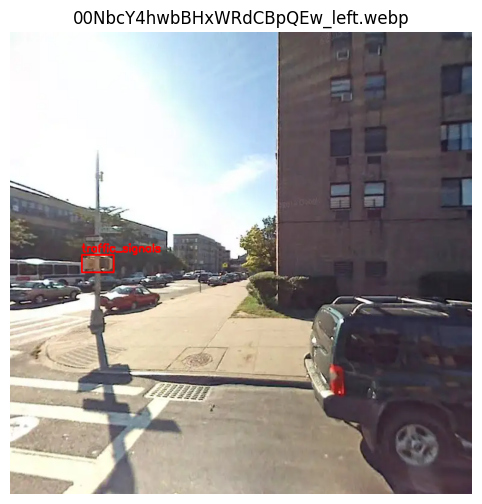

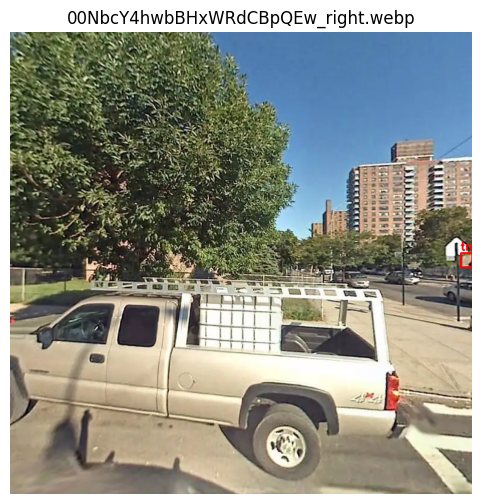

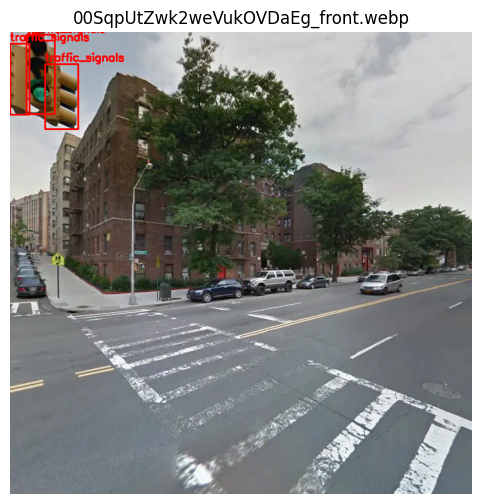

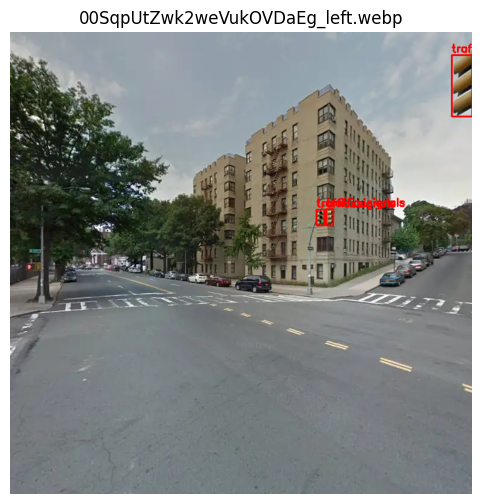

In [18]:
import os
import cv2
import matplotlib.pyplot as plt

def plot_image_with_boxes(image_path, boxes, labels, output_size=(10, 6)):
    """
    Loads an image from `image_path`, draws bounding boxes and labels from `boxes` and `labels`,
    then displays it using matplotlib.
    
    :param image_path: path to the image file
    :param boxes: list of bounding boxes, each a tuple/list [x_min, y_min, x_max, y_max]
    :param labels: list of labels for each bounding box
    :param output_size: (width, height) figure size for matplotlib
    """
    
    img_bgr = cv2.imread(image_path)
    if img_bgr is None:
        print(f"Could not load image from {image_path}")
        return
    
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    for (box, label) in zip(boxes, labels):
        x_min, y_min, x_max, y_max = box
        # Convert to integers
        x_min, y_min, x_max, y_max = int(x_min), int(y_min), int(x_max), int(y_max)
        
        cv2.rectangle(img_rgb, (x_min, y_min), (x_max, y_max), (255, 0, 0), 2)
        # Put label text above the top-left corner of the box
        cv2.putText(
            img_rgb, 
            str(label), 
            (x_min, max(y_min - 5, 0)), 
            cv2.FONT_HERSHEY_SIMPLEX, 
            0.6, 
            (255, 0, 0), 
            2
        )
    
    plt.figure(figsize=output_size)
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(os.path.basename(image_path))
    plt.show()

base_folder = "/hpi/fs00/scratch/alexandra.kudaeva/street-view-data/output/G340890_50m"


def get_image_path(row):
    image_id = row['id']
    subfolder = row['subfolder']
    orientation = row['orientation']
    return os.path.join(base_folder, subfolder, f"{image_id}_{orientation}.webp")

filtered_df['image_path'] = filtered_df.apply(get_image_path, axis=1)

grouped = filtered_df.groupby('image_path')
# get first 30 or so
unique_paths = filtered_df['image_path'].unique()[:30]

for path in unique_paths:
    rows_for_this_image = grouped.get_group(path)
    
    boxes = rows_for_this_image[['x_min','y_min','x_max','y_max']].values.tolist()
    labels = rows_for_this_image['label'].tolist()
    
    plot_image_with_boxes(path, boxes, labels)


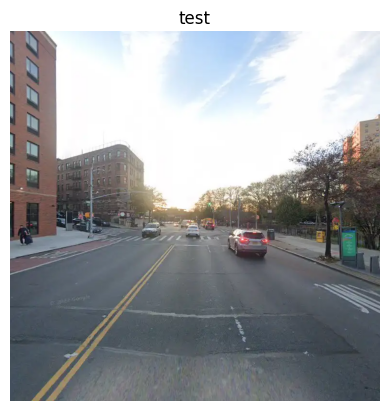

In [19]:
img_rgb = cv2.cvtColor(cv2.imread("/hpi/fs00/scratch/alexandra.kudaeva/street-view-data/output/G340890_50m/0/0/4/004g0nBjiAoWzLLLCT252A_front.webp"), cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(img_rgb)
plt.axis('off')
plt.title("test")
plt.show()